In [3]:
%pip install gdown

Note: you may need to restart the kernel to use updated packages.


In [4]:
!pip install shap

In [5]:
train = '1x_D1Feh88EFHQ63SEe55sAymUnztqzeK'
val = '1CcvUQxEuzPbwLOYjA1rxmyBxMF_au6wZ'
test = '1Kqf7-0Jkp1doGJWyhgxW1ku738IO4xji'

train_embeddings_per_word = '1kc018iaKNu8Y1DJd4WfyxWOxTQNNYt-h'
val_embeddings_per_word = '1--fg57qeqXEFrLqYvoVcN_9-o-Pzc26I'
test_embeddings_per_word = '1--K6JKVyn8UE9oo-4wzf5B6IzJ0JrI7c'

train_embeddings_per_sentence = '1-5dkTRFtcYbJJf5AWufBxgMba8FRSN7i'
val_embeddings_per_sentence = '1-FwXE-za1j3cBk9Cvw5T3DnzkJAGiY-M'
test_embeddings_per_sentence = '1-8icZrYP0oNUTnh6mwSGwK9fLAS1gcQU'

uncleaned_train_embedding = '13UONDopwe65QnuMK6jJWQUIdyx3OI-FA'
uncleaned_val_embedding = '1-0eCfZ8xSvLAI4RuC2e1WLf_Z09GmAaN'
uncleaned_test_embedding = '1-0CfuTbiTOIfDr4R76MO4Hd7GVeFlSrn'

In [6]:
!gdown {train}
!gdown {val}
!gdown {test}

!gdown {uncleaned_train_embedding}
!gdown {uncleaned_val_embedding}
!gdown {uncleaned_test_embedding}

Downloading...
From: https://drive.google.com/uc?id=1x_D1Feh88EFHQ63SEe55sAymUnztqzeK
To: /kaggle/working/train.pkl
100%|███████████████████████████████████████| 3.59M/3.59M [00:00<00:00, 112MB/s]
Downloading...
From: https://drive.google.com/uc?id=1CcvUQxEuzPbwLOYjA1rxmyBxMF_au6wZ
To: /kaggle/working/val.pkl
100%|█████████████████████████████████████████| 769k/769k [00:00<00:00, 104MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Kqf7-0Jkp1doGJWyhgxW1ku738IO4xji
To: /kaggle/working/test.pkl
100%|█████████████████████████████████████████| 762k/762k [00:00<00:00, 111MB/s]
Downloading...
From (uriginal): https://drive.google.com/uc?id=13UONDopwe65QnuMK6jJWQUIdyx3OI-FA
From (redirected): https://drive.google.com/uc?id=13UONDopwe65QnuMK6jJWQUIdyx3OI-FA&confirm=t&uuid=0e4a5803-0170-4c44-9aaa-d5703f0cf5e7
To: /kaggle/working/train_embeddings_per_word.pkl
100%|██████████████████████████████████████| 2.16G/2.16G [00:21<00:00, 98.4MB/s]
Downloading...
From (uriginal): https://drive.go

In [7]:
import pandas as pd
import numpy as np
import pickle
import torch
import shap
import seaborn as sns
import tensorflow as tf
import keras
import keras_tuner
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import GRU
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from transformers import BertModel, AutoTokenizer, TFAutoModel

## Classes

In [8]:
label_to_class = {
    0: 'none',
    1: 'anger',
    2: 'joy',
    3: 'sadness',
    4: 'love',
    5: 'sympathy',
    6: 'surprise',
    7: 'fear'
}
classes = ['none', 'anger', 'joy', 'sadness', 'love', 'sympathy', 'surprise', 'fear']

## Loading data

In [17]:
with open('/kaggle/working/train.pkl', 'rb') as f:
    train = pickle.load(f)
    
with open('/kaggle/working/val.pkl', 'rb') as f:
    val = pickle.load(f)

with open('/kaggle/working/test.pkl', 'rb') as f:
    test = pickle.load(f)

with open('/kaggle/working/train_embeddings_per_word.pkl', 'rb') as f:
    train_embeddings = pickle.load(f)
    
with open('/kaggle/working/val_embeddings_per_word.pkl', 'rb') as f:
    val_embeddings = pickle.load(f)
    
with open('/kaggle/working/test_embeddings_per_word.pkl', 'rb') as f:
    test_embeddings = pickle.load(f)

In [18]:
X_train = train['tweet']
y_train = train['label']
X_val = val['tweet']
y_val = val['label']
X_test = test['tweet']
y_test = test['label']

In [19]:
encoder = OneHotEncoder()

y_train = encoder.fit_transform(train['label'].values.reshape(-1,1)).toarray()
y_val = encoder.transform(val['label'].values.reshape(-1,1)).toarray()
y_test = encoder.transform(test['label'].values.reshape(-1,1)).toarray()

In [22]:
X_train = train_embeddings
X_val = val_embeddings
X_test = test_embeddings

In [21]:
BATCH_SIZE = 128
EPOCHS = 50
EMBED_SIZE = 86#768#86
LEARNING_RATE =  0.0053516485623658835

early_stopping_monitor = EarlyStopping(
    monitor='val_accuracy',
    min_delta=0,
    patience=10,
    verbose=0,
    mode='max',
    baseline=None,
    restore_best_weights=True)

In [20]:
train_embeddings.shape

(7045, 50, 768)

In [23]:
def build_gru(embedding_layer=False):
    model = Sequential()
    if embedding_layer:
        model.add(Embedding(VOCAB_SIZE_MARBERT, EMBED_SIZE, input_length=max_length, trainable=True))#, weights=[embedding_matrix.detach().numpy()]))
        model.add(GRU(256, return_sequences=True))
    else:
        model.add(GRU(256, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
#     model.add(Dropout(0.011691195516528197))
    model.add(Dropout(0.2))
    
    model.add(GRU(128, return_sequences=True))
    model.add(Dropout(0.2))
    
    model.add(GRU(64, return_sequences=False))
    model.add(Dropout(0.2))
    
    model.add(Dense(8, activation='softmax'))

    model.compile(optimizer=Adam(LEARNING_RATE),
                loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

In [24]:
model = build_gru(embedding_layer=False)

history = model.fit(X_train, np.asarray(y_train), validation_data=(X_val, np.asarray(y_val)), batch_size=BATCH_SIZE, epochs=EPOCHS, callbacks=[early_stopping_monitor])

Epoch 1/50
56/56 [==============================] - 14s 70ms/step - loss: 1.8788 - accuracy: 0.3046 - val_loss: 2.3830 - val_accuracy: 0.3285
Epoch 2/50
56/56 [==============================] - 2s 34ms/step - loss: 1.1949 - accuracy: 0.5896 - val_loss: 0.9498 - val_accuracy: 0.6854
Epoch 3/50
56/56 [==============================] - 2s 33ms/step - loss: 0.8586 - accuracy: 0.6964 - val_loss: 0.9214 - val_accuracy: 0.6960
Epoch 4/50
56/56 [==============================] - 2s 31ms/step - loss: 0.7458 - accuracy: 0.7405 - val_loss: 1.0213 - val_accuracy: 0.6543
Epoch 5/50
56/56 [==============================] - 2s 32ms/step - loss: 0.7224 - accuracy: 0.7553 - val_loss: 0.7710 - val_accuracy: 0.7411
Epoch 6/50
56/56 [==============================] - 2s 31ms/step - loss: 0.6363 - accuracy: 0.7774 - val_loss: 0.8043 - val_accuracy: 0.7351
Epoch 7/50
56/56 [==============================] - 2s 32ms/step - loss: 0.6195 - accuracy: 0.7864 - val_loss: 0.8139 - val_accuracy: 0.7205
Epoch 8/50
5

In [72]:
predictions = model.predict(X_test)
print(classification_report(y_test.argmax(axis=1), predictions.argmax(axis=1), target_names=classes))

48/48 [==============================] - 0s 8ms/step
              precision    recall  f1-score   support

        none       0.69      0.83      0.75       229
       anger       0.77      0.75      0.76       200
         joy       0.68      0.57      0.62       205
     sadness       0.77      0.57      0.65       185
        love       0.72      0.88      0.79       193
    sympathy       0.81      0.93      0.87       156
    surprise       0.82      0.64      0.72       154
        fear       0.89      0.94      0.91       188

    accuracy                           0.76      1510
   macro avg       0.77      0.76      0.76      1510
weighted avg       0.76      0.76      0.76      1510



In [75]:
len(predictions),len(y_test)

(1510, 1510)

In [79]:
from sklearn.metrics import classification_report
import pandas as pd



class_report_df = pd.DataFrame()

# Add index as a column
class_report_df['Index'] = range(len(predictions))

# Add true labels and predicted labels columns
class_report_df['True_Label'] = y_test.argmax(axis=1)
class_report_df['Predicted_Label'] = predictions.argmax(axis=1)


# Save the DataFrame to a CSV file
class_report_df.to_csv('classification_report.csv', index=False)


In [81]:
import pandas as pd
import random

# Load the CSV file into a DataFrame
classification_report_df = pd.read_csv('classification_report.csv')

# Filter the DataFrame for correctly classified instances
correctly_classified = classification_report_df[classification_report_df['True_Label'] == classification_report_df['Predicted_Label']]

# Filter the DataFrame for misclassified instances
misclassified = classification_report_df[classification_report_df['True_Label'] != classification_report_df['Predicted_Label']]

# Get 10 random correctly classified indices
correct_indices = random.sample(correctly_classified['Index'].tolist(), 10)

# Get 10 random misclassified indices
misclassified_indices = random.sample(misclassified['Index'].tolist(), 10)

print("Randomly Selected Indices of Correctly Classified Instances:", correct_indices)
print("Randomly Selected Indices of Misclassified Instances:", misclassified_indices)


Randomly Selected Indices of Correctly Classified Instances: [220, 443, 762, 1222, 1192, 1370, 560, 1334, 353, 1308]
Randomly Selected Indices of Misclassified Instances: [883, 568, 1040, 398, 260, 1342, 952, 1430, 988, 919]


<Axes: >

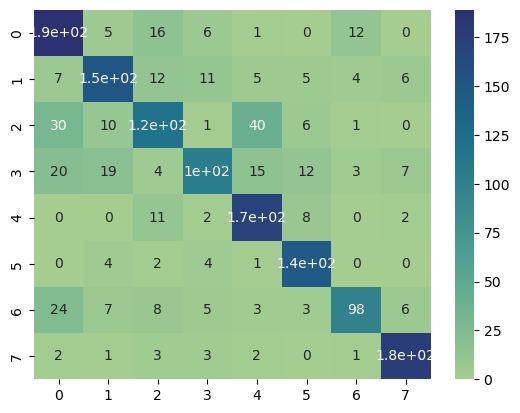

In [26]:
sns.heatmap(confusion_matrix(y_test.argmax(axis=1), predictions.argmax(axis=1)), annot=True, cmap='crest')

In [27]:
model.save('GRRU')

In [28]:
model = keras.models.load_model("GRRU")

## **Explainability**

In [32]:
marbert_model_path = 'UBC-NLP/MARBERT'
tokenizer = AutoTokenizer.from_pretrained(marbert_model_path, from_tf=True)
marbert_model = TFAutoModel.from_pretrained(marbert_model_path, output_hidden_states=True)

remove_special_tokens=1  #change this to 0 if you want to keep the special token


def bert_tokenize(text: str) -> dict:
    tokens = tokenizer(text, padding='max_length', truncation=True, max_length=50)
    if remove_special_tokens == 1:
        shape = np.array(tokens['input_ids']).shape
        modified_input_ids = np.zeros(shape).astype(np.int32)
        modified_attention_mask = np.zeros(shape).astype(np.int32)
        # Modify the input IDs and attention mask as per your requirement
        for i in range(shape[0]):
            modified_input_ids[i] = [0 if token_id == 1 else 0 if token_id == 3 else 0 if token_id == 0 else 0 if token_id == 2 else 0 if token_id == 4 else token_id for token_id in tokens['input_ids'][i]]
            modified_attention_mask[i] = [0 if token_id in [1, 3, 0, 2, 4] else 1 for token_id in tokens['input_ids'][i]]
        # Update the input IDs and attention mask in the tokens dictionary
        tokens['input_ids'] = modified_input_ids
        tokens['attention_mask'] = modified_attention_mask
    return tokens


def get_embeddings(ids, mask, type_ids):
    ids = tf.convert_to_tensor(ids)
    #print(ids.shape)
    mask = tf.convert_to_tensor(mask)
    #print(mask.shape)
    #print(mask)
    type_ids = tf.convert_to_tensor(type_ids)
    #print(type_ids.shape)
    hidden_states = marbert_model(input_ids=ids, attention_mask=mask, token_type_ids=type_ids)[0]
    averaged_embedding = tf.reduce_mean(hidden_states, axis=1)
    return hidden_states.numpy()

def embedd(text):
    if type(text)==type(pd.Series()):
        text=text.values.astype(str).tolist()
    tokens = bert_tokenize(text)
    xlen = np.array(tokens['input_ids']).shape[0]
    x_emb = np.zeros((xlen,50,768))
    for i in range(0,xlen,100):
        if(i+100 < xlen):
            input_ids = tokens['input_ids'][i:i+100]
            attention_mask = tokens['attention_mask'][i:i+100]
            token_type_ids = tokens['token_type_ids'][i:i+100]
            x_emb[i:i+100] = get_embeddings(input_ids,attention_mask,token_type_ids)
        else:
            input_ids = tokens['input_ids'][i:xlen]
            attention_mask = tokens['attention_mask'][i:xlen]
            token_type_ids = tokens['token_type_ids'][i:xlen]
            x_emb[i:xlen] = get_embeddings(input_ids,attention_mask,token_type_ids)
    return x_emb



All model checkpoint layers were used when initializing TFBertModel.

All the layers of TFBertModel were initialized from the model checkpoint at UBC-NLP/MARBERT.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


### Some samples

### deep SHAP  (Not working due to version issues) https://stackoverflow.com/questions/64226155/lookuperror-gradient-registry-has-no-entry-for-shap-tensorliststack-using-de

In [84]:
def shap_model_predict(text):
  text = text.astype(str).tolist()
  tokens = bert_tokenize(text)
  xlen = np.array(tokens['input_ids']).shape[0]
  x_emb = np.zeros((xlen,50,768))
  for i in range(0,xlen,100):
    if(i+100 < xlen):
        input_ids = tokens['input_ids'][i:i+100]
        attention_mask = tokens['attention_mask'][i:i+100]
        token_type_ids = tokens['token_type_ids'][i:i+100]
        x_emb[i:i+100] = get_embeddings(input_ids,attention_mask,token_type_ids)
    else:
        input_ids = tokens['input_ids'][i:xlen]
        attention_mask = tokens['attention_mask'][i:xlen]
        token_type_ids = tokens['token_type_ids'][i:xlen]
        x_emb[i:xlen] = get_embeddings(input_ids,attention_mask,token_type_ids)
  return model.predict(x_emb)



import shap

masker = shap.maskers.Text(tokenizer=r"\W+")
explainer = shap.Explainer(shap_model_predict, output_names=classes, masker=masker)


def deep_shap_explain(idx):
    instance = test['tweet'].iloc[idx:idx+1].values.astype(str).tolist()
    print("Instance:", instance)
    print("True label:", label_to_class[classification_report_df['True_Label'].iloc[idx]])
    print("Pred label:", label_to_class[classification_report_df['Predicted_Label'].iloc[idx]])

    print("Original tweet:", test['tweet'].iloc[idx])
    
    # Assuming 'explainer' is a function that computes SHAP values for the instance
    shap_values = explainer(instance)  # You need to replace 'explainer' with the actual SHAP explainer function
    
    # Assuming 'shap' is the SHAP library
    shap.text_plot(shap_values)  # Display a summary plot of SHAP values
    
    # Print all SHAP values for the instance
    print("-------------------------------------------------------------------------------------")
    
    

In [85]:
for index in correct_indices:
    deep_shap_explain(index)

for index in misclassified_indices:
    deep_shap_explain(index)

Instance: ['يكفي انهم احباب الله🕊 التعامل معهم وكانك تتعامل مع ملائكه قلوبهم نقيه لا يعرفون النفاق ولا الكذب 🕊 يتعاملون معك بكل عفويه وجمال  الاطفال']
True label: sympathy
Pred label: sympathy
Original tweet: يكفي انهم احباب الله🕊 التعامل معهم وكانك تتعامل مع ملائكه قلوبهم نقيه لا يعرفون النفاق ولا الكذب 🕊 يتعاملون معك بكل عفويه وجمال  الاطفال
1/1 [==============================] - 0s 24ms/step


  0%|          | 0/498 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Partition explainer: 2it [00:20, 20.31s/it]               


-------------------------------------------------------------------------------------
Instance: ['دعم محمد بن نايف مليون متابع يستاهل كل خير اميرنا المحبوب. الله يحفظك من كل شر ويطول بعمرك']
True label: love
Pred label: love
Original tweet: دعم محمد بن نايف مليون متابع يستاهل كل خير اميرنا المحبوب. الله يحفظك من كل شر ويطول بعمرك
1/1 [==============================] - 0s 23ms/step


  0%|          | 0/306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Partition explainer: 2it [00:12, 12.08s/it]               


-------------------------------------------------------------------------------------
Instance: ['al3bdullh    الله يعين اللي بيكنسه 💔']
True label: sympathy
Pred label: sympathy
Original tweet: al3bdullh    الله يعين اللي بيكنسه 💔
1/1 [==============================] - 0s 35ms/step


-------------------------------------------------------------------------------------
Instance: ['الحب الحقيقي بين الزوجين لابد ان يبني علي الاحترام مهما كانت الميانه والاريحيه في التعاملات وعمق العلاقه ..']
True label: love
Pred label: love
Original tweet: الحب الحقيقي بين الزوجين لابد ان يبني علي الاحترام مهما كانت الميانه والاريحيه في التعاملات وعمق العلاقه ..
1/1 [==============================] - 0s 24ms/step


  0%|          | 0/272 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Partition explainer: 2it [00:10, 10.77s/it]               


-------------------------------------------------------------------------------------
Instance: ['حُب من القلب لن يشيب وان شابت  وجوهُ الزمان']
True label: love
Pred label: love
Original tweet: حُب من القلب لن يشيب وان شابت  وجوهُ الزمان
1/1 [==============================] - 0s 23ms/step


-------------------------------------------------------------------------------------
Instance: ['يا خساره ...']
True label: sadness
Pred label: sadness
Original tweet: يا خساره ...
1/1 [==============================] - 0s 25ms/step


-------------------------------------------------------------------------------------
Instance: ['لا بس واضح ان الحكومه مرعوبه من 11 11 تعويم جنيه و رفع الدعم عن المحروقات في يوم واحد .. دي زي اللي بتقول...']
True label: fear
Pred label: fear
Original tweet: لا بس واضح ان الحكومه مرعوبه من 11 11 تعويم جنيه و رفع الدعم عن المحروقات في يوم واحد .. دي زي اللي بتقول...
1/1 [==============================] - 0s 23ms/step


  0%|          | 0/498 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Partition explainer: 2it [00:20, 20.88s/it]               


-------------------------------------------------------------------------------------
Instance: ['sniper1 ودعائنا لكم بالنصر ياجنود الوطن يافخر الوطن اللهم سدد رميهم']
True label: sympathy
Pred label: sympathy
Original tweet: sniper1 ودعائنا لكم بالنصر ياجنود الوطن يافخر الوطن اللهم سدد رميهم
1/1 [==============================] - 0s 25ms/step


-------------------------------------------------------------------------------------
Instance: ['ساره سمير فخر مصر في الاوليمبياد ....... تسلمي']
True label: joy
Pred label: joy
Original tweet: ساره سمير فخر مصر في الاوليمبياد ....... تسلمي
1/1 [==============================] - 0s 23ms/step


-------------------------------------------------------------------------------------
Instance: ['العراق تخرج من الاوليمبياد بضياع فرصه ذهبيه للتاهل و البرازيل تتاهل اول مجموعه  Rio2016  bra  irq  football']
True label: none
Pred label: none
Original tweet: العراق تخرج من الاوليمبياد بضياع فرصه ذهبيه للتاهل و البرازيل تتاهل اول مجموعه  Rio2016  bra  irq  football
1/1 [==============================] - 0s 27ms/step


  0%|          | 0/272 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Partition explainer: 2it [00:11, 11.07s/it]               


-------------------------------------------------------------------------------------
Instance: ['هيا الاوليمبياد دي هتخلص امتي عشان انا اتخنقت']
True label: anger
Pred label: sadness
Original tweet: هيا الاوليمبياد دي هتخلص امتي عشان انا اتخنقت
1/1 [==============================] - 0s 25ms/step


-------------------------------------------------------------------------------------
Instance: [':  الثقافيه   عكاظ   سوق عكاظ  شرفت بمعانقه عكاظ شعرًا مع اصدقائي الشعراء المتدفقين   شكرًا عكاظ']
True label: joy
Pred label: love
Original tweet: :  الثقافيه   عكاظ   سوق عكاظ  شرفت بمعانقه عكاظ شعرًا مع اصدقائي الشعراء المتدفقين   شكرًا عكاظ
1/1 [==============================] - 0s 23ms/step


  0%|          | 0/272 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Partition explainer: 2it [00:11, 11.07s/it]               


-------------------------------------------------------------------------------------
Instance: ['الظاهر ان انا الوحيد اللي مش متابع  الاوليمبياد دي 😏']
True label: surprise
Pred label: none
Original tweet: الظاهر ان انا الوحيد اللي مش متابع  الاوليمبياد دي 😏
1/1 [==============================] - 0s 22ms/step


-------------------------------------------------------------------------------------
Instance: [': الشباب المشاركين سواء كسبوا او خسروا احنافخورين بيكم جدا ومثلتوا مصر بشكل مشرف طز فاللي يلومكم اللي اداكو حاجه ياخدها  المص…']
True label: love
Pred label: sympathy
Original tweet: : الشباب المشاركين سواء كسبوا او خسروا احنافخورين بيكم جدا ومثلتوا مصر بشكل مشرف طز فاللي يلومكم اللي اداكو حاجه ياخدها  المص…
1/1 [==============================] - 0s 23ms/step


  0%|          | 0/462 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Partition explainer: 2it [00:18, 18.36s/it]               


-------------------------------------------------------------------------------------
Instance: ['هنجيب ميداليه ف الاوليمبياد يا عماد !😂😂😂😂😂😂😂😂😂😂']
True label: joy
Pred label: none
Original tweet: هنجيب ميداليه ف الاوليمبياد يا عماد !😂😂😂😂😂😂😂😂😂😂
1/1 [==============================] - 0s 25ms/step


-------------------------------------------------------------------------------------
Instance: ['تحفه الصوره ايوه كده الا انا عيني وجعتني من الابيض واسود']
True label: joy
Pred label: sympathy
Original tweet: تحفه الصوره ايوه كده الا انا عيني وجعتني من الابيض واسود
1/1 [==============================] - 0s 23ms/step


-------------------------------------------------------------------------------------
Instance: ['Sadam H الرجل الذي لاقي الموت فهزمه كما هزم ايران وخشاه اعداءه عاش جسورا ومات جسورا']
True label: love
Pred label: sympathy
Original tweet: Sadam H الرجل الذي لاقي الموت فهزمه كما هزم ايران وخشاه اعداءه عاش جسورا ومات جسورا
1/1 [==============================] - 0s 25ms/step


  0%|          | 0/240 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


-------------------------------------------------------------------------------------
Instance: ['الاربعاء ديربي..  اتحاد الشرس &amp الهلال الساعه 7:30 بالتوفيق شباب الاتحاد']
True label: love
Pred label: joy
Original tweet: الاربعاء ديربي..  اتحاد الشرس &amp الهلال الساعه 7:30 بالتوفيق شباب الاتحاد
1/1 [==============================] - 0s 24ms/step


  0%|          | 0/132 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


-------------------------------------------------------------------------------------
Instance: ['في داخلي رغبه بالكلام مع احدهم دون ان اعرفه ولا يعرفني احكي له وبعد ذلك اسير وكل منا يذهب في طريق!']
True label: sadness
Pred label: love
Original tweet: في داخلي رغبه بالكلام مع احدهم دون ان اعرفه ولا يعرفني احكي له وبعد ذلك اسير وكل منا يذهب في طريق!
1/1 [==============================] - 0s 24ms/step


  0%|          | 0/420 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Partition explainer: 2it [00:17, 17.21s/it]               


-------------------------------------------------------------------------------------
Instance: ['حاجه بستفز منها الاطفال التبته : D']
True label: joy
Pred label: anger
Original tweet: حاجه بستفز منها الاطفال التبته : D
1/1 [==============================] - 0s 25ms/step


-------------------------------------------------------------------------------------
